In [1]:
import numpy as np
import pandas as pd
import os
import cv2 as cv
import matplotlib.pyplot as plt
import tensorflow as tf

from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.applications.inception_resnet_v2 import preprocess_input, decode_predictions
from tensorflow.keras import backend as K
from tensorflow.keras.layers import add, Conv2D, MaxPooling2D, UpSampling2D, Input, BatchNormalization, RepeatVector, Reshape
from tensorflow.keras.layers import concatenate
from tensorflow.keras.models import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import set_random_seed
from tensorflow.keras.callbacks import EarlyStopping, TensorBoard
import warnings
warnings.filterwarnings('ignore')
np.random.seed(42)
set_random_seed(42)

In [2]:
InputPath = "./images/images/art and culture/"

In [3]:
## We need to add noise to images so that our model becomes robust and it can handle any kind of senario real life and also these noise will help in training
## noise will be : gaussian, salt and pepper, poission, speckle

def noisy(noise_type, image):
    if noise_type == "gauss":
        row, col, ch = image.shape # row col and channel
        mean = 0
        var = 0.0001
        sigma = var**0.5
        gauss = np.random.normal(mean, sigma, (row,col,ch))
        gauss = gauss.reshape(row, col, ch)
        noisy = gauss + image
        return noisy
    
    elif noise_type == "s&p":
        row, col, ch = image.shape
        s_vs_p = 0.5
        amount = 1
        out = np.copy(image)
        
        # Salt mode
        num_salt = np.ceil(amount * image.size * s_vs_p / ch)
        coords = [np.random.randint(0, i, int(num_salt)) for i in (row, col)]
        out[coords[0], coords[1], :] = 1
        
        # Pepper mode
        num_pepper = np.ceil(amount * image.size * (1. - s_vs_p) / ch)
        coords = [np.random.randint(0, i, int(num_pepper)) for i in (row, col)]
        out[coords[0], coords[1], :] = 0  # Use 0 for pepper (black pixels)
        
        return out
    
    elif noise_type == "poission":
        vals = len(np.unique(image))
        vals = 2 ** np.ceil(np.log2(vals))
        noisy = np.random.poisson(image * vals) / float(vals)
        return noisy
    
    elif noise_type == "speckle":
        row, col, ch = image.shape
        gauss = np.random.randn(row, col, ch)
        gauss = gauss.reshape(row, col, ch)
        noisy = image + image * gauss
        return noisy
    
    else:
        print("Invalid noise type. Choose from gauss, s&p, poisson, speckle")

### Real Image

255

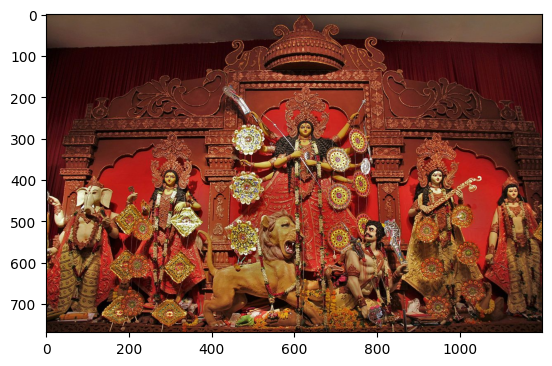

In [4]:
img = cv.imread(InputPath + "0 (3).jpg")
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
l = img.max()
plt.imshow(img)
l

### Adding noise

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.04415183744580719..255.0395925753541].


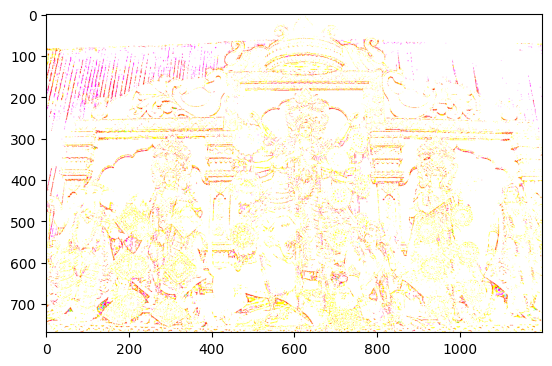

In [5]:
## gauss
Noise = noisy("gauss", img)
plt.imshow(Noise)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..258.83984375].


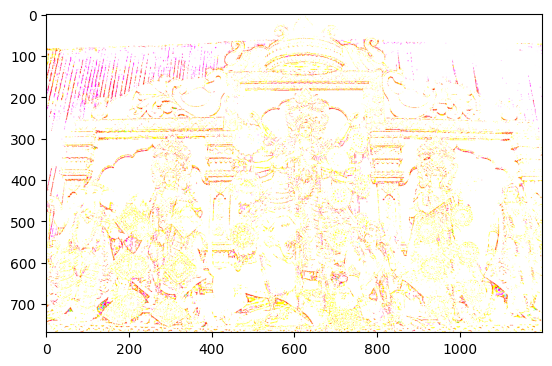

In [6]:
## Poission
Noise = noisy("poission", img)
plt.imshow(Noise)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-721.3048763518141..1279.504355440881].


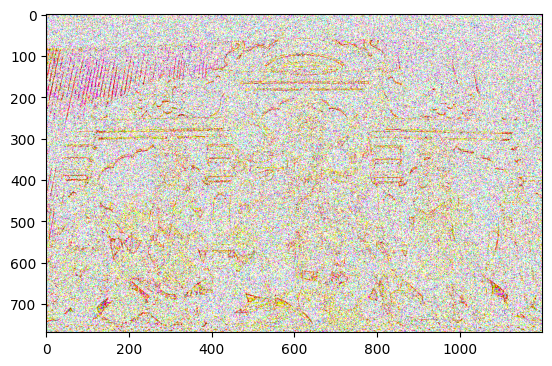

In [7]:
## Speckle
Noise = noisy("speckle", img)
plt.imshow(Noise)

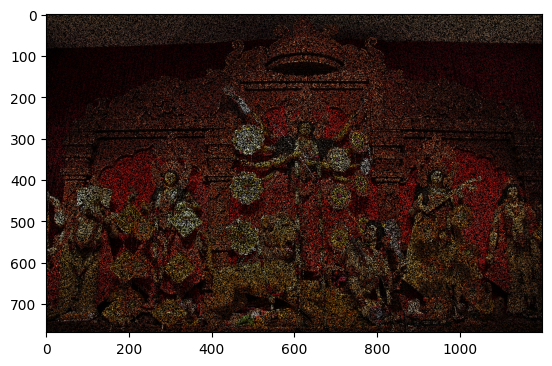

In [8]:
## Salt and pepper
Noise = noisy("s&p", img)
plt.imshow(Noise)

### Image with low brightness and salt pepper noise to get perfect low light image

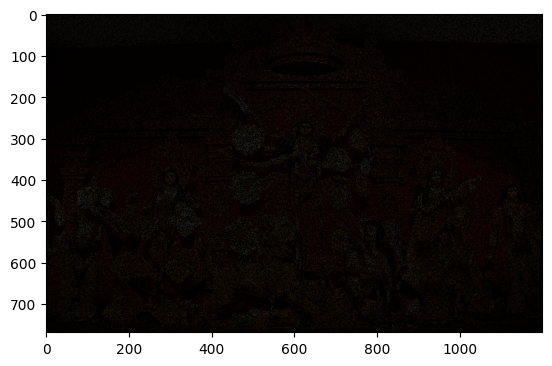

In [9]:
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)
hsv[..., 2] = hsv[..., 2] * 0.2
img1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
Noise2 = noisy("s&p", img1)

plt.imshow(Noise2)

In [10]:
os.listdir(InputPath)

['0 (2).jpg',
 '0 (3).jpg',
 '0 (4).jpg',
 '0 (5).jpg',
 '0 (6).jpg',
 '0 (7).jpg',
 '0 (8).jpg',
 '0 (9).jpg',
 '0.jpg',
 '0001.jpg',
 '0002.jpg',
 '0003.jpg',
 '0004.jpg',
 '0005.jpg',
 '0006.jpg',
 '0007.jpg',
 '0008.jpg',
 '0009.jpg',
 '0010.jpg',
 '0011.jpg',
 '0012.jpg',
 '0013.jpg',
 '0014.jpg',
 '0015.jpg',
 '0016.jpg',
 '0017.jpg',
 '0018.jpg',
 '0019.jpg',
 '0020.jpg',
 '0021.jpg',
 '0022.jpg',
 '0023.jpg',
 '0024.jpg',
 '0026.jpg',
 '0027.jpg',
 '0028.jpg',
 '0029.jpg',
 '0030.jpg',
 '01dee7c857692cce250fcc7fba309f3f.jpg',
 '0735.jpg',
 '0736.jpg',
 '0737.jpg',
 '0738.jpg',
 '0739.jpg',
 '0740.jpg',
 '0741.jpg',
 '0742.jpg',
 '0743.jpg',
 '0744.jpg',
 '0745.jpg',
 '0746.jpg',
 '0747.jpg',
 '0748.jpg',
 '0749.jpg',
 '0751.jpg',
 '0752.jpg',
 '0753.jpg',
 '0754.jpg',
 '0755.jpg',
 '0756.jpg',
 '0757.jpg',
 '0758.jpg',
 '0759.jpg',
 '0760.jpg',
 '0761.jpg',
 '0762.jpg',
 '0763.jpg',
 '0764.jpg',
 '0765.jpg',
 '0766.jpg',
 '0767.jpg',
 '0768.jpg',
 '0769.jpg',
 '0770.jpg',
 '077

In [11]:
## Preprocess Data
def PreProcessData(ImagePath):
    X_ = []
    y_ = []
    count = 0
    for imageDir in os.listdir(ImagePath):
        if count<2131:
            try:
                count = count + 1
                img = cv.imread(ImagePath + imageDir)
                img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
                img_y = cv.resize(img, (500,500))
                hsv = cv.cvtColor(img_y, cv.COLOR_BGR2HSV)
                hsv[..., 2] = hsv[..., 2] * 0.2
                img_1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
                Noisy_img = noisy("s&p", img_1)
                X_.append(Noisy_img)
                y_.append(img_y)
            except:
                pass
    
    X_ = np.array(X_)
    y_ = np.array(y_)
    
    return X_, y_

In [12]:
X_, y_ = PreProcessData(InputPath)

In [87]:
K.clear_session()
def InstantiateModel(in_):
    # 16 are number of filters, (3,3) is filter size, padding="same" means the i/p and o/p is same size, strides=1 means move one at a time and (in_) input tensor
    model_1 = Conv2D(16, (3,3), activation="relu", padding="same", strides=1)(in_)
    model_1 = Conv2D(32, (3,3), activation="relu", padding="same", strides=1)(model_1)
    model_1 = Conv2D(64, (2,2), activation="relu", padding="same", strides=1)(model_1)
    
    model_2 = Conv2D(32, (3,3), activation='relu', padding='same', strides=1)(in_)
    model_2 = Conv2D(64, (2,2), activation='relu', padding='same', strides=1)(model_2)
    
    model_2_0 = Conv2D(64, (2,2), activation='relu', padding='same', strides=1)(model_2)
    
    model_add = add([model_1, model_2, model_2_0])
    
    model_3 = Conv2D(64, (3,3), activation='relu', padding='same', strides=1)(model_add)
    model_3 = Conv2D(32, (3,3), activation='relu', padding='same', strides=1)(model_3)
    model_3 = Conv2D(16, (2,2), activation='relu', padding='same', strides=1)(model_3)
    
    model_3_1 = Conv2D(32, (3,3), activation='relu', padding='same', strides=1)(model_add)
    model_3_1 = Conv2D(16, (2,2), activation='relu', padding='same', strides=1)(model_3_1)
    
    model_3_2 = Conv2D(16, (2,2), activation='relu', padding='same', strides=1)(model_add)
    
    model_add_2 = add([model_3_1, model_3_2, model_3])
    
    model_4 = Conv2D(16, (3,3), activation='relu', padding='same', strides=1)(model_add_2)
    model_4_1 = Conv2D(16, (3,3), activation='relu', padding='same', strides=1)(model_add)
    
    model_add_3 = add([model_4_1, model_add_2, model_4])
    
    model_5 = Conv2D(16, (3,3), activation='relu', padding='same', strides=1)(model_add_3)
    model_5 = Conv2D(16, (2,2), activation='relu', padding='same', strides=1)(model_add_3)
    
    model_5 = Conv2D(3, (3,3), activation='relu', padding='same', strides=1)(model_5)
    
    return model_5

In [88]:
Input_Sample = Input(shape=(500,500,3))
Output_ = InstantiateModel(Input_Sample)
Model_Enhancer = Model(inputs=Input_Sample, outputs=Output_)

In [89]:
Model_Enhancer.compile(optimizer='adam', loss='mean_squared_error')
Model_Enhancer.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 500, 500, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 500, 500, 16)         448       ['input_1[0][0]']             
                                                                                                  
 conv2d_3 (Conv2D)           (None, 500, 500, 32)         896       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 500, 500, 32)         4640      ['conv2d[0][0]']              
                                                                                              

 conv2d_7 (Conv2D)           (None, 500, 500, 32)         18464     ['conv2d_6[0][0]']            
                                                                                                  
 conv2d_10 (Conv2D)          (None, 500, 500, 16)         2064      ['conv2d_9[0][0]']            
                                                                                                  
 conv2d_11 (Conv2D)          (None, 500, 500, 16)         4112      ['add[0][0]']                 
                                                                                                  
 conv2d_8 (Conv2D)           (None, 500, 500, 16)         2064      ['conv2d_7[0][0]']            
                                                                                                  
 add_1 (Add)                 (None, 500, 500, 16)         0         ['conv2d_10[0][0]',           
                                                                     'conv2d_11[0][0]',           
          

In [90]:
# from tensorflow.keras.utils import plot_model

# plot_model(Model_Enhancer, to_file="model_.png", show_shapes=True, show_layer_names=True)

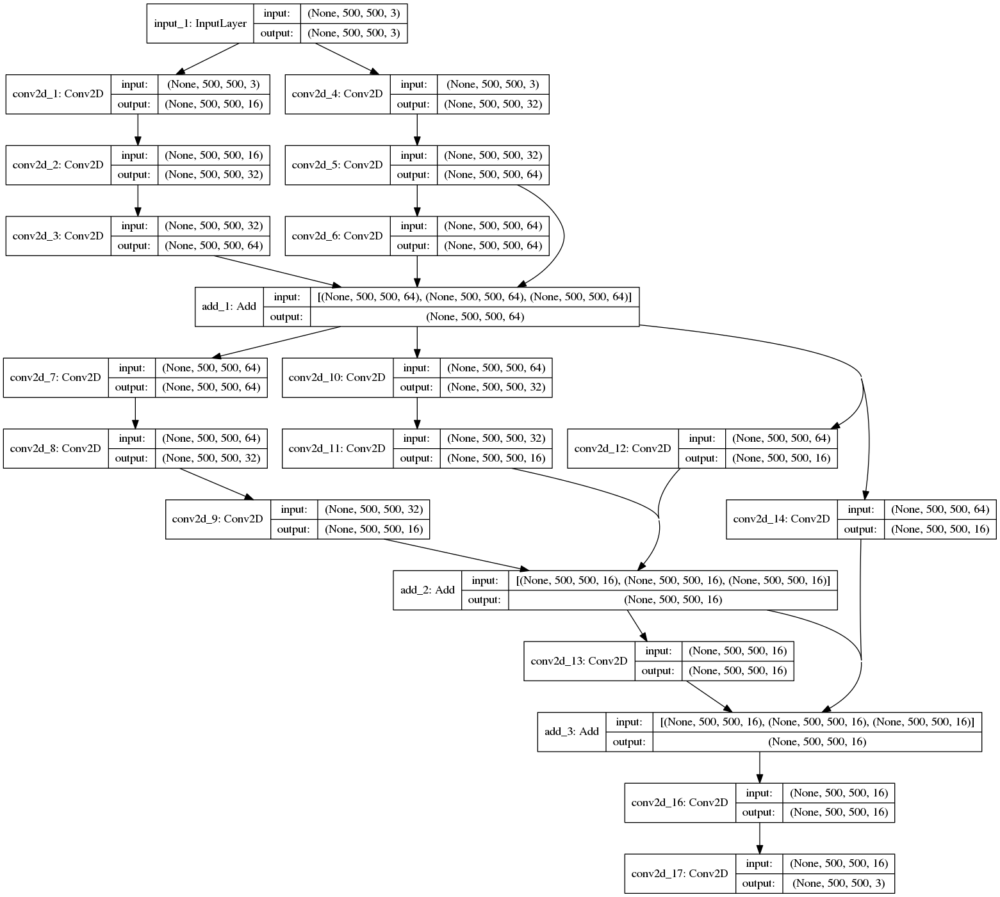

In [91]:
from IPython.display import Image
Image(retina=True, filename='model_.png')

In [92]:
def GenerateInputs(X, y):
    for i in range(len(X)):
        X_input = X[i].reshape(1, 500, 500, 3)
        y_input = y[i].reshape(1, 500, 500, 3)
        yield (X_input, y_input)

In [93]:
tensorboard_callbacks = TensorBoard(log_dir='./logs1')
early_stopping_callback = EarlyStopping(monitor='loss', patience=10, restore_best_weights=True)

In [94]:
Model_Enhancer.fit_generator(GenerateInputs(X_,y_),epochs=53,verbose=1,steps_per_epoch=39,shuffle=True, callbacks=[tensorboard_callbacks])

Epoch 1/53
39/39 [==============================] - 35s 851ms/step - loss: 4931.0195
Epoch 2/53
39/39 [==============================] - 31s 796ms/step - loss: 3540.9880
Epoch 3/53
39/39 [==============================] - 31s 791ms/step - loss: 2666.5935
Epoch 4/53
39/39 [==============================] - 31s 789ms/step - loss: 5090.7339
Epoch 5/53
39/39 [==============================] - 31s 803ms/step - loss: 1111.1276
Epoch 6/53
39/39 [==============================] - 31s 788ms/step - loss: 303.4777
Epoch 7/53
39/39 [==============================] - 31s 794ms/step - loss: 268.9583
Epoch 8/53
39/39 [==============================] - 31s 797ms/step - loss: 1382.9380
Epoch 9/53
39/39 [==============================] - 31s 794ms/step - loss: 1741.0237
Epoch 10/53
39/39 [==============================] - 31s 786ms/step - loss: 1859.4644
Epoch 11/53
39/39 [==============================] - 30s 781ms/step - loss: 1809.6372
Epoch 12/53
39/39 [==============================] - 31s 793ms/st

In [95]:
Model_Enhancer.save('model_enhancer.h5')

In [96]:
TestPath = "./images/images/art and culture/"

In [97]:
def ExtractTestInput(ImagePath):
    img = cv.imread(ImagePath)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    img_ = cv.resize(img,(500,500))
    hsv = cv.cvtColor(img_, cv.COLOR_BGR2HSV) #convert it to hsv
    hsv[...,2] = hsv[...,2]*0.2
    img1 = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
    Noise = noisy("s&p",img1)
    Noise = Noise.reshape(1,500,500,3)
    return Noise

In [98]:
ImagePath=TestPath+"101 (6).jpg"
image_for_test = ExtractTestInput(ImagePath)
Prediction = Model_Enhancer.predict(image_for_test)

1/1 [==============================] - 0s 263ms/step


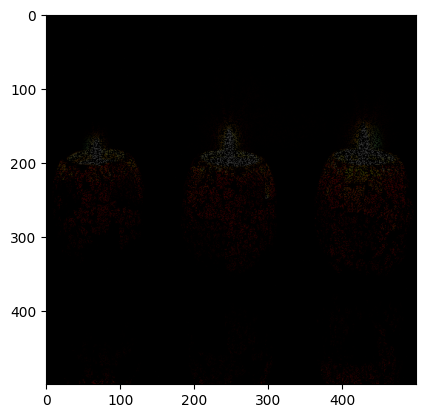

In [99]:
plt.imshow(image_for_test.reshape(500,500,3))

In [100]:
Prediction = Prediction.reshape(500,500,3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..302.10757].


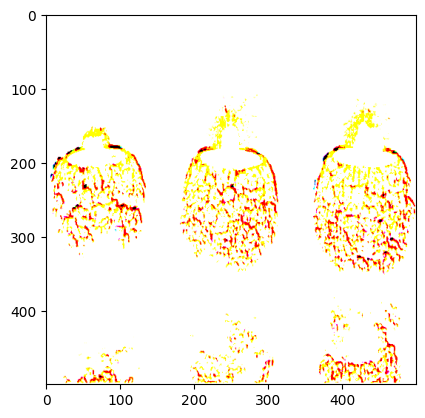

In [101]:
plt.imshow(Prediction)

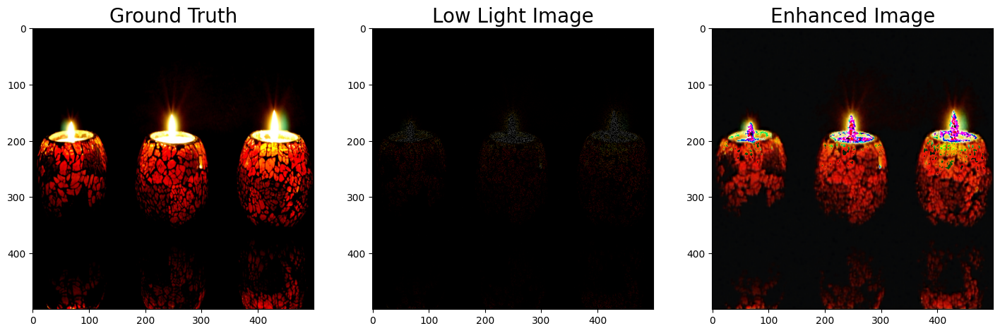

In [102]:
Image_test=TestPath+"101 (6).jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

In [103]:
TestPath2="./validation/validation/travel and adventure/"

1/1 [==============================] - 0s 155ms/step


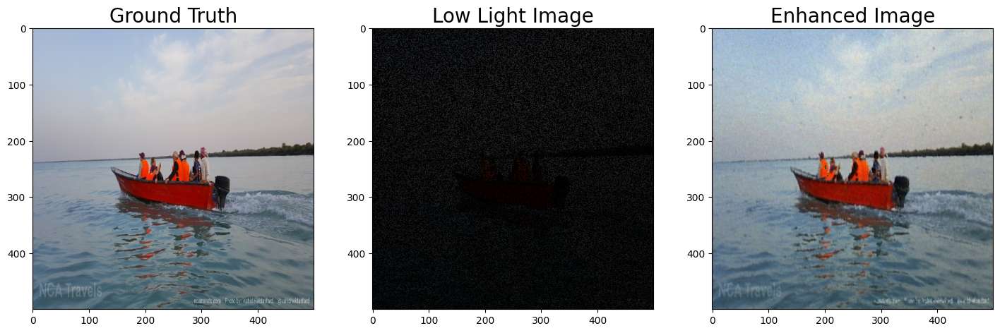

In [104]:
Image_test2=TestPath2+"0.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

1/1 [==============================] - 0s 174ms/step


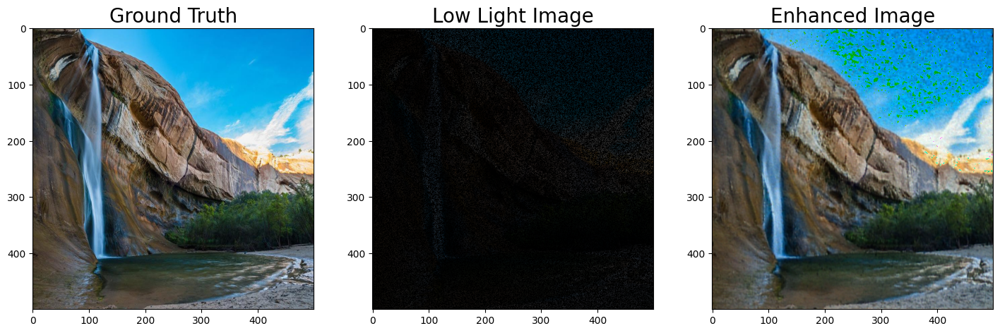

In [105]:
Image_test2=TestPath2+"13.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

1/1 [==============================] - 0s 143ms/step


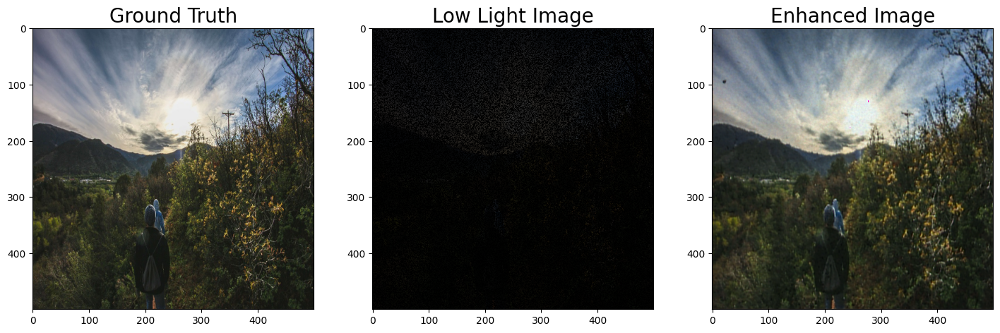

In [106]:
Image_test2=TestPath2+"18.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

1/1 [==============================] - 0s 142ms/step


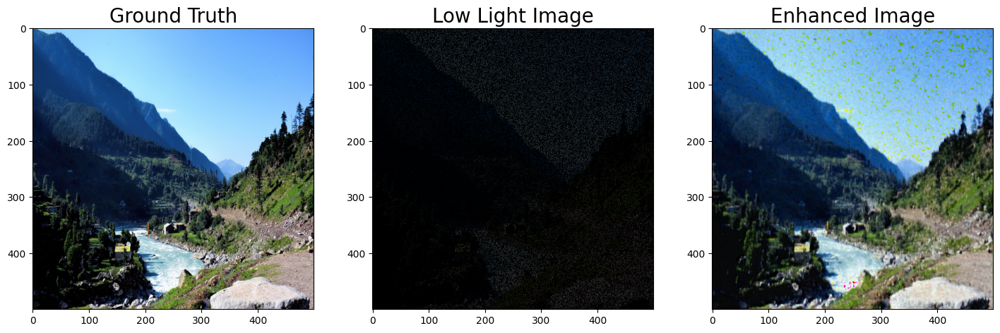

In [107]:
Image_test2=TestPath2+"2.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

1/1 [==============================] - 0s 151ms/step


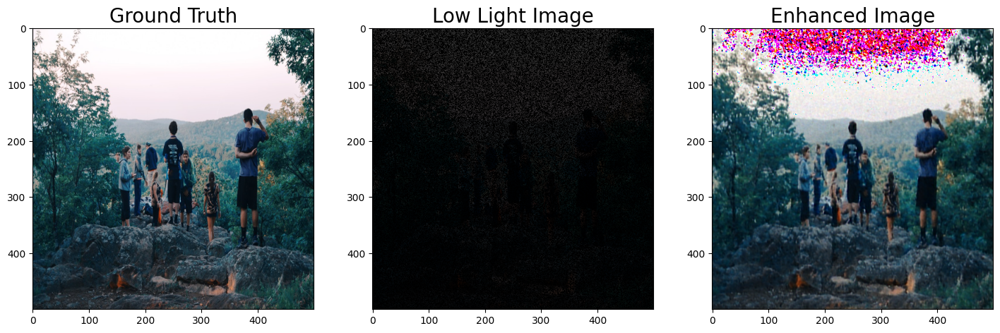

In [108]:
Image_test2=TestPath2+"14.jpg"
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

1/1 [==============================] - 0s 147ms/step


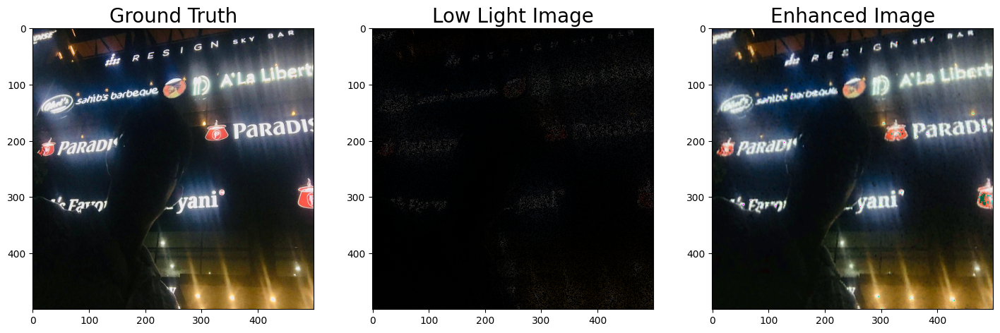

In [113]:
Image_test2='./YHCY4135.JPG'
plt.figure(figsize=(30,30))
plt.subplot(5,5,1)
img_1 = cv.imread(Image_test2)
img_1 = cv.cvtColor(img_1, cv.COLOR_BGR2RGB)
img_1 = cv.resize(img_1, (500, 500))
plt.title("Ground Truth",fontsize=20)
plt.imshow(img_1)

plt.subplot(5,5,1+1)
img_ = ExtractTestInput(Image_test2)
Prediction = Model_Enhancer.predict(img_)
img_ = img_.reshape(500,500,3)
plt.title("Low Light Image",fontsize=20)
plt.imshow(img_)

plt.subplot(5,5,1+2)
Prediction = Prediction.reshape(500,500,3)
img_[:,:,:] = Prediction[:,:,:]
plt.title("Enhanced Image",fontsize=20)
plt.imshow(img_)

In [1]:
print('done')

done
